# Figures for Chapter 4

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

plt.rcParams['figure.dpi'] = 500
plt.rcParams['font.family'] = 'Microsoft YaHei'
plt.rcParams['axes.unicode_minus'] = False

In [2]:
# colors
BLUE = '#2878B5'
LIGHTBLUE = '#9AC9DB'
ORANGE = '#F8AC8C'
RED = '#C82423'
PINK = '#FF8884'
GREY = '#9E9E9E'
DEEPGREEN = '#32B897'
GREEN = '#96CCCB'

## Study region

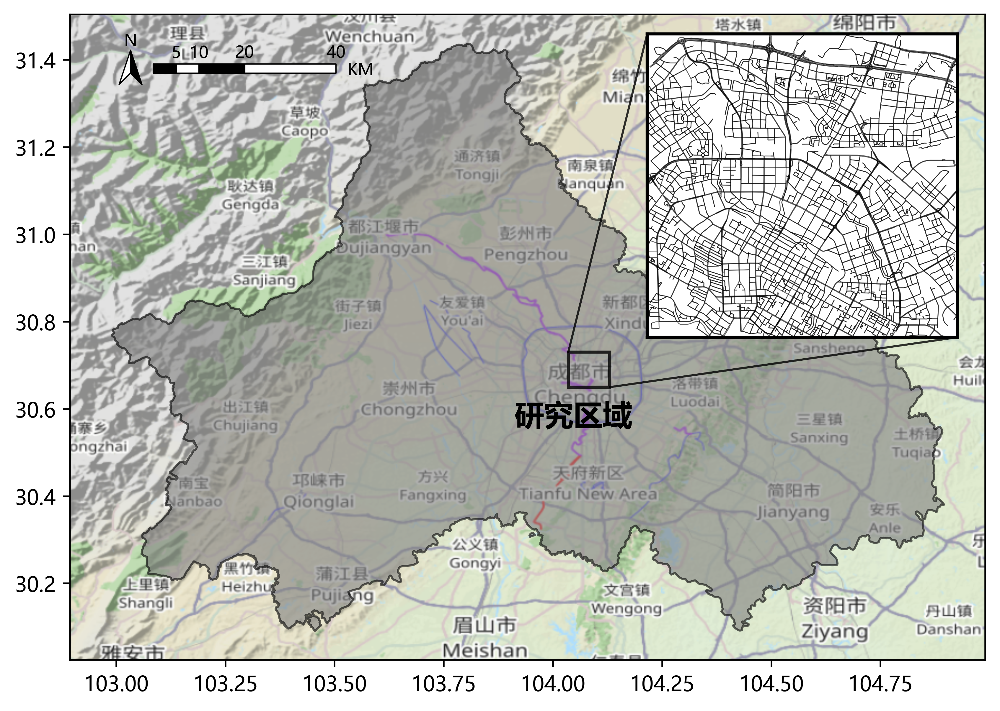

In [4]:
import contextily as ctx
import osmnx as ox
import transbigdata as tbd

# geo data preparation
Chengdu_bound = ox.geocode_to_gdf("Chengdu, Sichuan, China")  # bounding of Chengdu city
north, south, east, west = 30.73, 30.65, 104.13, 104.035
road_graph = ox.graph_from_bbox(north, south, east, west, network_type='drive')
road_graph = ox.graph_to_gdfs(road_graph, nodes=False)

fig, ax = plt.subplots(1, 1, figsize=(8,6))

# plot Chengdu bound
Chengdu_bound.plot(ax=ax, facecolor='GREY', edgecolor='k', alpha=0.6)
ctx.add_basemap(ax=ax, crs=Chengdu_bound.crs.to_string(), source='https://c.tile.thunderforest.com/cycle/{z}/{x}/{y}.png?apikey=41f4f936f1d148f69cbd100812875c88')
ax.text(0.55, 0.4, "研究区域", transform=ax.transAxes, fontweight='bold', fontsize='x-large', ha='center', va='top')

# plot road graph
ax_ = ax.inset_axes([0.55, 0.5, 0.5, 0.47], transform=ax.transAxes)
road_graph.plot(ax=ax_, facecolor=None, color='k', alpha=0.6, linewidth=0.4)
ax_.set_xlim(west, east)
ax_.set_ylim(south, north)
ax_.set_xticks([])
ax_.set_yticks([])
for loc in ['left', 'right', 'top', 'bottom']:
    ax_.spines[loc].set_color('k')
    ax_.spines[loc].set_linewidth(1.5)
ax.indicate_inset_zoom(ax_, edgecolor="black", alpha=0.8, linewidth=1.5)

# scale bar
tbd.plotscale(ax=ax, bounds=[west, south, east, north], accuracy=5000, rect=[-10, 9])

plt.show()

## Trip-level analysis

In [3]:
import pickle
with open("Z://Data/NEE_Chengdu/agg/agg_trip_20161120.pkl", 'rb') as f:
    agg_trip = pickle.load(f)
OpModeERs = np.load("./data/agg/OpModeERs.npy")

agg_trip = agg_trip[agg_trip['mileage'] <= 0.6].copy()
agg_trip = agg_trip[agg_trip['brakeCount'] > 0].copy()
agg_trip = agg_trip[agg_trip['brakeEventNum'] > 0].copy()
agg_trip = agg_trip[agg_trip['initSpeed_mean'] <= 120].copy()
agg_trip = agg_trip[agg_trip['acc_mean'] >= -1].copy()
agg_trip = agg_trip[agg_trip['brakeDecel_mean'] <= 3].copy()
agg_trip = agg_trip[(agg_trip['VSP_mean'] >= -15) & (agg_trip['VSP_mean'] <= 25)].copy()
agg_trip = agg_trip[agg_trip['brakingFreq'] <= 140].copy()
agg_trip['ER'] = agg_trip.apply(lambda x: sum(x['OpModeCount'] / x['trajCount'] * OpModeERs), axis=1)  # g/hr/veh
agg_trip['EF'] = agg_trip.apply(lambda x: x['ER'] * (x['trajCount'] / 3600) / x['mileage'] * 1000, axis=1)  # mg/km/veh
agg_trip['brakeTime_mean'] = agg_trip['brakeCount'] / agg_trip['brakeEventNum']  # sec

### speed profile

In [4]:
# calculate speed bin OpMode fraction
aggFile = agg_trip
xCol, yCol = 'speed_mean', 'OpModeCount'
bins = np.arange(0, 110, 10)
count = [aggFile[(aggFile[xCol] >= minV) & (aggFile[xCol] < maxV)][yCol].sum() for minV, maxV in zip(bins[:-1], bins[1:])]
agg_OpMode_speed = pd.DataFrame({"OpModeCount":count}, index=bins[:-1])
agg_OpMode_speed['OpModeFrac'] = agg_OpMode_speed['OpModeCount'].apply(lambda x: x / sum(x))

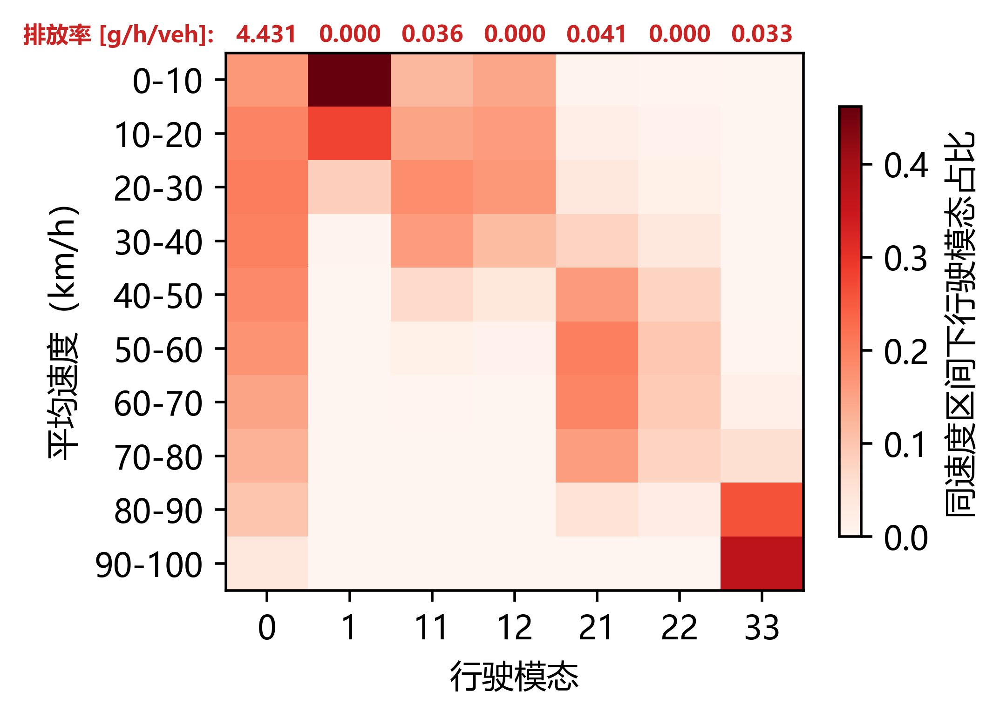

In [15]:
from matplotlib.colors import Normalize
fig, ax = plt.subplots(1,1, figsize=(4,3))

cmap = 'Reds'

data = np.array(agg_OpMode_speed['OpModeFrac'].to_list())
# OpModes = [0,1,11,12,13,14,15,16,21,22,23,24,25,27,28,29,30,33,35,37,38,39,40]
OpModes = [0,1,11,12,21,22,33]
ax.pcolor(data[:, [0,1,2,3,8,9,17]], cmap=cmap)
ax.invert_yaxis()
ax.set_xticks(np.arange(len(OpModes))+0.5)
ax.set_xticklabels(OpModes)
ax.set_yticks(np.arange(len(agg_OpMode_speed.index))+0.5)
ax.set_yticklabels(['%d-%d' % (vmin, vmax) for vmin, vmax in zip(bins[:-1], bins[1:])])
ax.set_xlabel("行驶模态")
ax.set_ylabel("平均速度（km/h）")

cbar = fig.colorbar(plt.cm.ScalarMappable(
                        norm=Normalize(data.min(), data.max()),
                        cmap=cmap),
                    ax=ax, location='right', shrink=0.8)
cbar.set_label(label='同速度区间下行驶模态占比')

ax.text(0-1.3, -0.1, '排放率 [g/h/veh]:', size=7, color=RED, va='bottom', ha='center', weight='bold')
ax.text(0+0.5, -0.1, '4.431', size=7, color=RED, va='bottom', ha='center', weight='bold')
ax.text(1+0.5, -0.1, '0.000', size=7, color=RED, va='bottom', ha='center', weight='bold')
ax.text(2+0.5, -0.1, '0.036', size=7, color=RED, va='bottom', ha='center', weight='bold')
ax.text(3+0.5, -0.1, '0.000', size=7, color=RED, va='bottom', ha='center', weight='bold')
ax.text(4+0.5, -0.1, '0.041', size=7, color=RED, va='bottom', ha='center', weight='bold')
ax.text(5+0.5, -0.1, '0.000', size=7, color=RED, va='bottom', ha='center', weight='bold')
ax.text(6+0.5, -0.1, '0.033', size=7, color=RED, va='bottom', ha='center', weight='bold')

plt.show()

### speed & braking frequency

In [5]:
import seaborn as sns

def binCal(xCol, yCol, bins, aggFile):
    mean = [aggFile[(aggFile[xCol] >= minV) & (aggFile[xCol] < maxV)][yCol].mean() for minV, maxV in zip(bins[:-1], bins[1:])]
    std = [aggFile[(aggFile[xCol] >= minV) & (aggFile[xCol] < maxV)][yCol].std() for minV, maxV in zip(bins[:-1], bins[1:])]
    return mean, std

def corrPlot(ax, xCol, yCol, bins, xLabel, yLabel, subID, cmap, aggFile, histBinNum=30):
    # hist plot
    sns.histplot(
        aggFile, x=xCol, y=yCol, bins=histBinNum, stat='proportion', ax=ax,
        fill=True, cmap=cmap, cbar=True, cbar_kws=dict(location='right', shrink=0.8, label="频率"),
        )
    binMean, binStd =binCal(xCol, yCol, bins, aggFile=aggFile)
    ax.errorbar(
        bins[:-1]+(bins[1]-bins[0])/2, binMean, binStd,
        color='k', linestyle='dotted', linewidth=1, markerfacecolor='w', marker='d', alpha=0.8,
        label="平均值"
    )
    ax.set_xticks(bins)
    ax.set_xlabel("%s\n(%s)"%(xLabel, subID) if subID else xLabel)
    ax.set_ylabel(yLabel)
    ax.legend()
    ax.grid(axis='x', linestyle=":")
    return ax

d:\Software\Anaconda3\envs\ml\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
d:\Software\Anaconda3\envs\ml\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
d:\Software\Anaconda3\envs\ml\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
d:\Software\Anaconda3\envs\ml\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to 

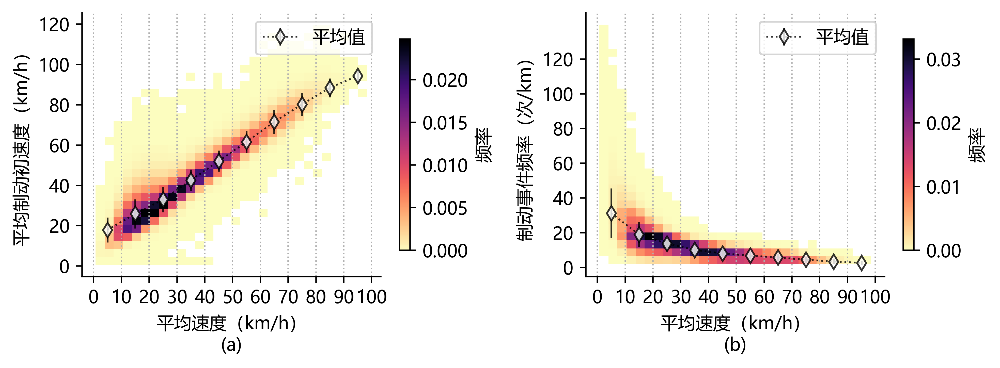

In [6]:
fig, ax = plt.subplots(1,2,figsize=(8,3))
ax = ax.flatten()

ax[0] = corrPlot(
    ax[0], xCol='speed_mean', yCol='initSpeed_mean', xLabel="平均速度（km/h）", yLabel="平均制动初速度（km/h）",bins=np.arange(0,110,10),
    subID='a', cmap='magma_r', aggFile=agg_trip
)
ax[1] = corrPlot(
    ax[1], xCol='speed_mean', yCol='brakingFreq', xLabel="平均速度（km/h）", yLabel="制动事件频率（次/km）",bins=np.arange(0,110,10),
    subID='b', cmap='magma_r', aggFile=agg_trip
)
ax[1].set_yticks(np.arange(0, 140, 20))

for ax_ in ax:
    ax_.spines['top'].set_visible(False)
    ax_.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

### impact of braking frequency

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


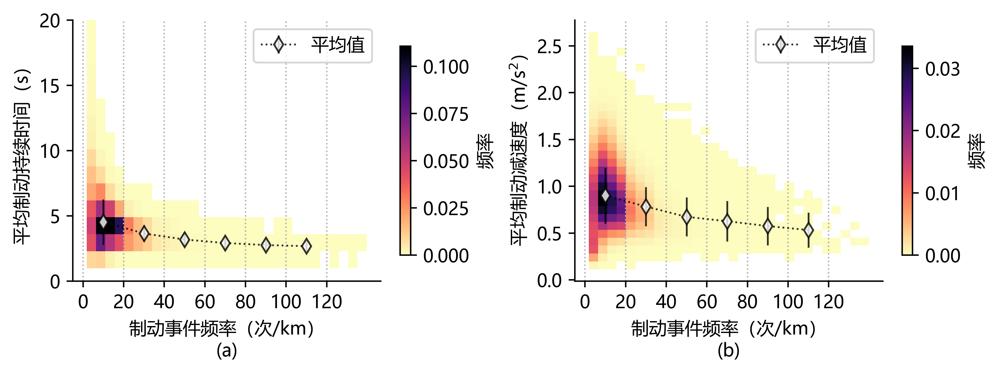

In [12]:
fig, ax = plt.subplots(1,2,figsize=(8,3))
ax = ax.flatten()

ax[0] = corrPlot(
    ax[0], xCol='brakingFreq', yCol='brakeTime_mean', xLabel="制动事件频率（次/km）", yLabel="平均制动持续时间（s）",bins=np.arange(0,130,20),
    subID='a', cmap='magma_r', aggFile=agg_trip
)
ax[0].set_ylim(0, 20)
ax[1] = corrPlot(
    ax[1], xCol='brakingFreq', yCol='brakeDecel_mean', xLabel="制动事件频率（次/km）", yLabel="平均制动减速度（m/s$^2$）",bins=np.arange(0,130,20),
    subID='b', cmap='magma_r', aggFile=agg_trip
)
# ax[1].set_yticks(np.arange(0, 140, 20))

for ax_ in ax:
    ax_.spines['top'].set_visible(False)
    ax_.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

## Machine learning

In [1]:
# load model
import xgboost as xgb
xgb_model = xgb.Booster()
xgb_model.load_model("./data/shap/best_model_EF.json")

In [17]:
# training data
data = agg_trip[[
    'speed_mean', 'speed_std',
    'acc_mean', 'acc_std',
    'VSP_mean', 'VSP_std',
    'brakeDecel_mean', 'brakeTime_mean', 'brakingFreq', 'initSpeed_mean',
    'grade_mean', 'grade_std', 'idlingFrac',
    'EF'
]]
data.reset_index(drop=True, inplace=True)
X, Y = data.iloc[:, :-1], data['EF']
# predict
X_dm = xgb.DMatrix(X)
y_pred = xgb_model.predict(X_dm)
pred_results =pd.DataFrame({"index":Y.index,"true": Y, "pred":y_pred})
pred_results.sort_values(by='true', inplace=True)

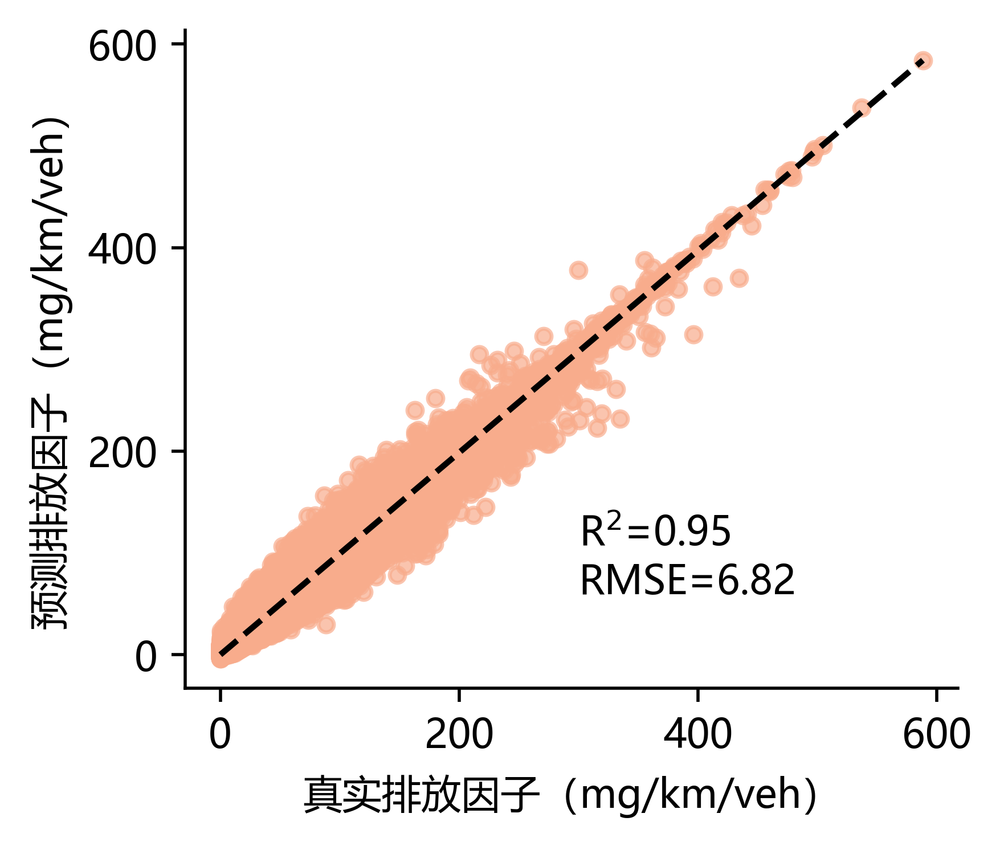

In [18]:
fig, ax = plt.subplots(1,1,figsize=(3.5,3))

ax.scatter(pred_results['true'], pred_results['pred'], s=15, c=ORANGE, marker='o', alpha=0.7)
ax.plot([0, pred_results['true'].max()], [0, pred_results['pred'].max()], 'k--')

ax.text(300, 60, 'R$^2$=%.2f\nRMSE=%.2f' % (0.9534, 6.8217))

ax.set_yticks(np.arange(0, 610, 200))
ax.set_xlabel("真实排放因子（mg/km/veh）")
ax.set_ylabel("预测排放因子（mg/km/veh）")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

## SHAP

In [5]:
import shap
explainer = shap.TreeExplainer(xgb_model)

with open("./data/shap/shap_value_EF.pkl", 'rb') as f:
    shapV = pickle.load(f)

data = agg_trip[[
    'speed_mean', 'speed_std',
    'acc_mean', 'acc_std',
    'VSP_mean', 'VSP_std',
    'brakeDecel_mean', 'brakeTime_mean', 'brakingFreq', 'initSpeed_mean',
    'grade_mean', 'grade_std', 'idlingFrac',
    'EF'
]].sample(100000, random_state=42)
data.reset_index(drop=True, inplace=True)
X, Y = data.iloc[:, :-1], data['EF']

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [6]:
names = ['平均速度', '速度标准差',
        '平均加速度', '加速度标准差',
        '平均VSP', 'VSP标准差',
        '平均制动减速度', '平均制动持续时间', '制动事件频率', '平均制动初速度',
        '平均道路坡度角', '道路坡度角标准差', '怠速时间比例']

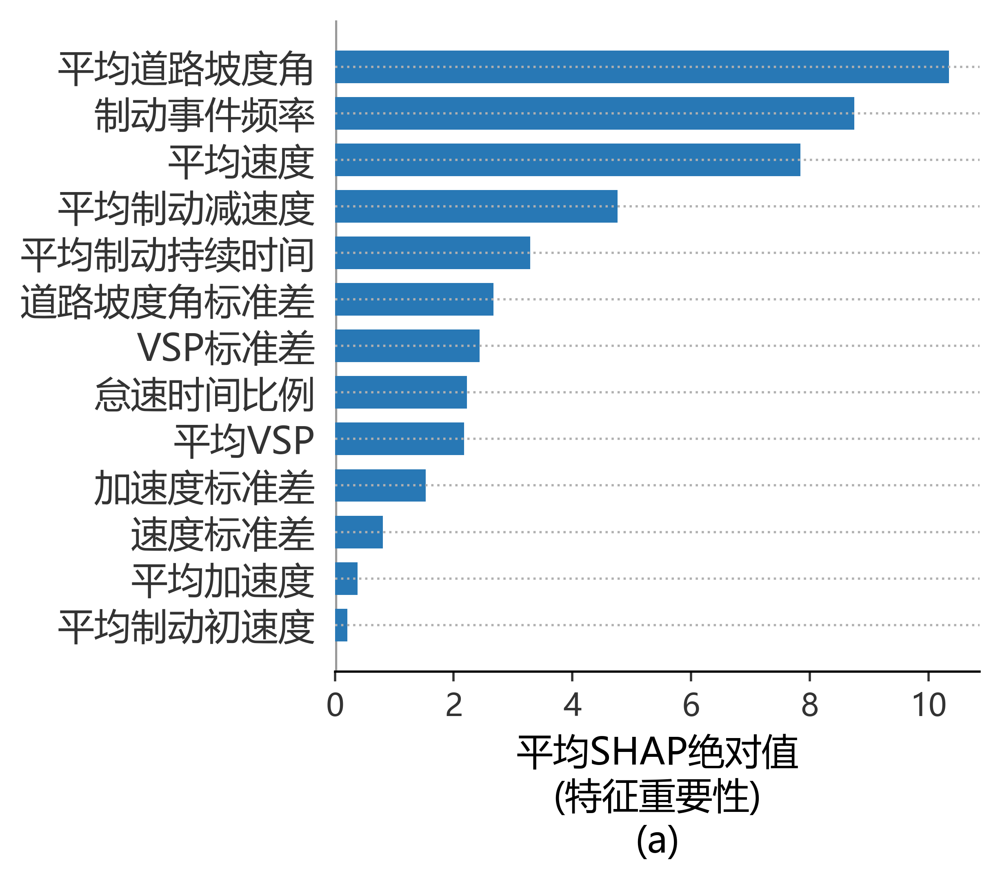

In [7]:
size = (5,4)
f = plt.figure(figsize=size)
shap.summary_plot(
    shapV, X, plot_type="bar", feature_names=names,
    color=BLUE, plot_size=size, show=False)
plt.xlabel("平均SHAP绝对值\n(特征重要性)\n(a)")
plt.grid(axis='y', linestyle=":", zorder=-1)
plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


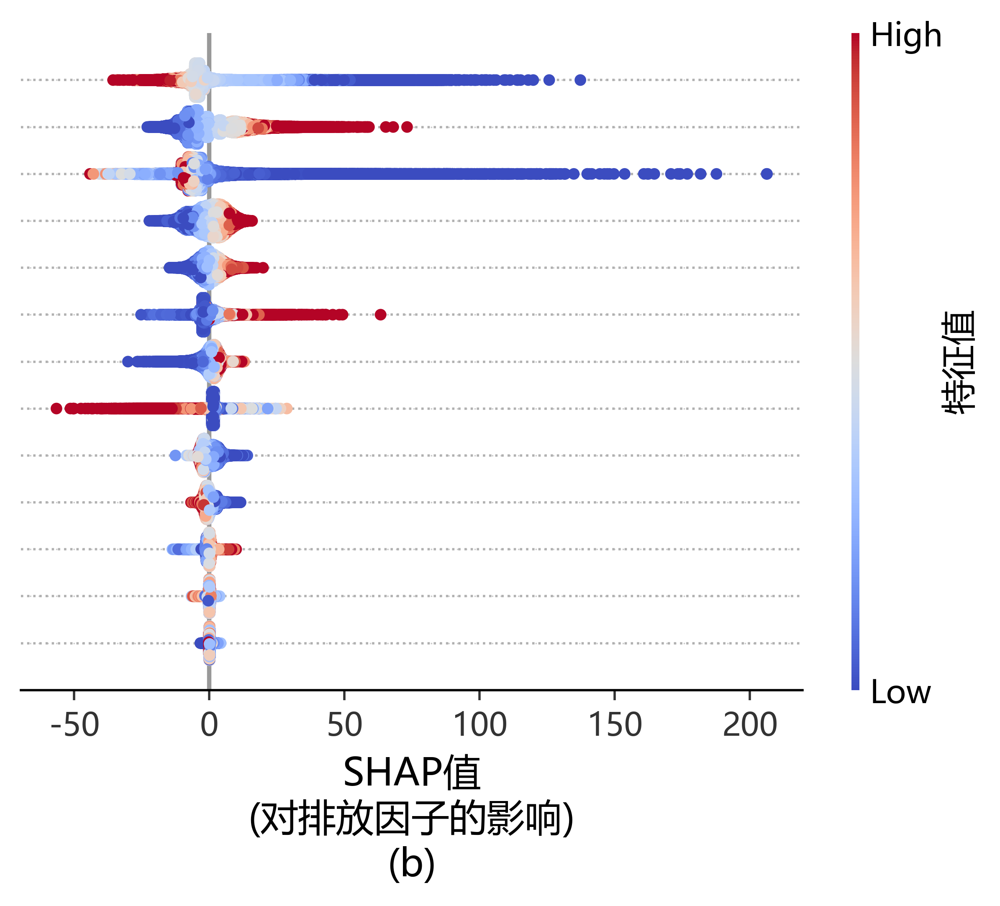

In [22]:
size = (5,4)
f = plt.figure(figsize=size)
shap.summary_plot(
    shapV, X, plot_type='dot', feature_names=["" for n in names],
    plot_size=size, show=False, cmap='coolwarm'
)
plt.xlabel("SHAP值\n(对排放因子的影响)\n(b)")
cbar = plt.gcf().axes[-1]
cbar.set_ylabel('特征值')
plt.grid(axis='y', linestyle=":", zorder=-1)
plt.show()


In [8]:
import seaborn as sns

def binCal(xCol, yCol, bins, aggFile):
    mean = [aggFile[(aggFile[xCol] >= minV) & (aggFile[xCol] < maxV)][yCol].mean() for minV, maxV in zip(bins[:-1], bins[1:])]
    std = [aggFile[(aggFile[xCol] >= minV) & (aggFile[xCol] < maxV)][yCol].std() for minV, maxV in zip(bins[:-1], bins[1:])]
    
    return mean, std

def corrPlot(ax, xCol, yCol, bins, xLabel, yLabel, subID, cmap, aggFile, histBinNum=30):
    # hist plot
    sns.histplot(
        aggFile, x=xCol, y=yCol, bins=histBinNum, stat='proportion', ax=ax,
        fill=True, cmap=cmap, cbar=True, cbar_kws=dict(location='right', shrink=0.8, label="频率"),
        )
    binMean, binStd =binCal(xCol, yCol, bins, aggFile=aggFile)
    ax.errorbar(
        bins[:-1]+(bins[1]-bins[0])/2, binMean, binStd,
        color='k', linestyle='dotted', linewidth=1, markerfacecolor='w', marker='d', alpha=0.8,
        label="平均值"
    )
    ax.set_xticks(bins)
    ax.set_xlabel("%s\n(%s)"%(xLabel, subID) if subID else xLabel)
    ax.set_ylabel(yLabel)
    ax.legend()
    ax.grid(axis='x', linestyle=":")

    return ax

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN be

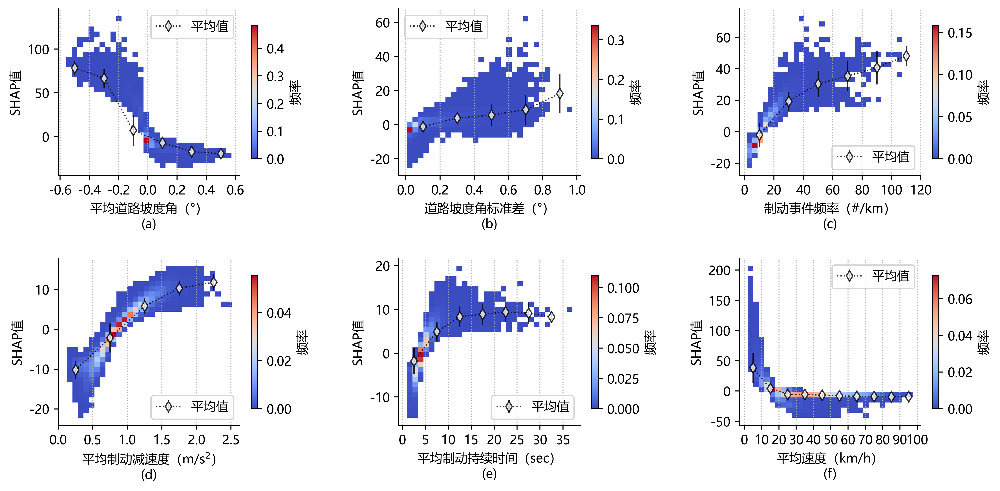

In [9]:
shapDF = pd.DataFrame(shapV.values, columns=[n+'_shap' for n in X.columns])
shapDF = pd.merge(shapDF, X, left_index=True, right_index=True)

fig, ax = plt.subplots(2,3,figsize=(13,6))
ax = ax.flatten()

ax[0] = corrPlot(
    ax[0], xCol='grade_mean', yCol='grade_mean_shap', xLabel="平均道路坡度角（°）", yLabel="SHAP值",bins=np.arange(-6,7,2)/10,
    subID='a', cmap='coolwarm', aggFile=shapDF
)

ax[1] = corrPlot(
    ax[1], xCol='grade_std', yCol='grade_std_shap', xLabel="道路坡度角标准差（°）", yLabel="SHAP值",bins=np.arange(0,11,2)/10,
    subID='b', cmap='coolwarm', aggFile=shapDF)
ax[1].legend(loc=2)

ax[2] = corrPlot(
    ax[2], xCol='brakingFreq', yCol='brakingFreq_shap', xLabel="制动事件频率（#/km）", yLabel="SHAP值",bins=np.arange(0,140,20),
    subID='c', cmap='coolwarm', aggFile=shapDF)
ax[2].legend(loc=4)

ax[3] = corrPlot(
    ax[3], xCol='brakeDecel_mean', yCol='brakeDecel_mean_shap', xLabel="平均制动减速度（m/s$^2$）", yLabel="SHAP值",bins=np.arange(0,26,5)/10,
    subID='d', cmap='coolwarm', aggFile=shapDF)
ax[3].legend(loc=4)

ax[4] = corrPlot(
    ax[4], xCol='brakeTime_mean', yCol='brakeTime_mean_shap', xLabel="平均制动持续时间（sec）", yLabel="SHAP值",bins=np.arange(0,40,5),
    subID='e', cmap='coolwarm', aggFile=shapDF)
ax[4].legend(loc=4)

ax[5] = corrPlot(
    ax[5], xCol='speed_mean', yCol='speed_mean_shap', xLabel="平均速度（km/h）", yLabel="SHAP值",bins=np.arange(0,110,10),
    subID='f', cmap='coolwarm', aggFile=shapDF
)


for ax_ in ax:
    ax_.spines['top'].set_visible(False)
    ax_.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.5)
plt.subplots_adjust(hspace=0.5)
plt.show()

## OpMode braking and ER

In [25]:
import pickle
with open("./data/agg/agg_OpMode.pkl", 'rb') as f:
    agg_OpMode = pickle.load(f)
agg_OpMode['brakeFrac'] = agg_OpMode['brakeCount'] / agg_OpMode['trajCount']
agg_OpMode['brakeDecelBinFrac'] = agg_OpMode['brakeDecelBinCount'] / agg_OpMode['brakeCount']

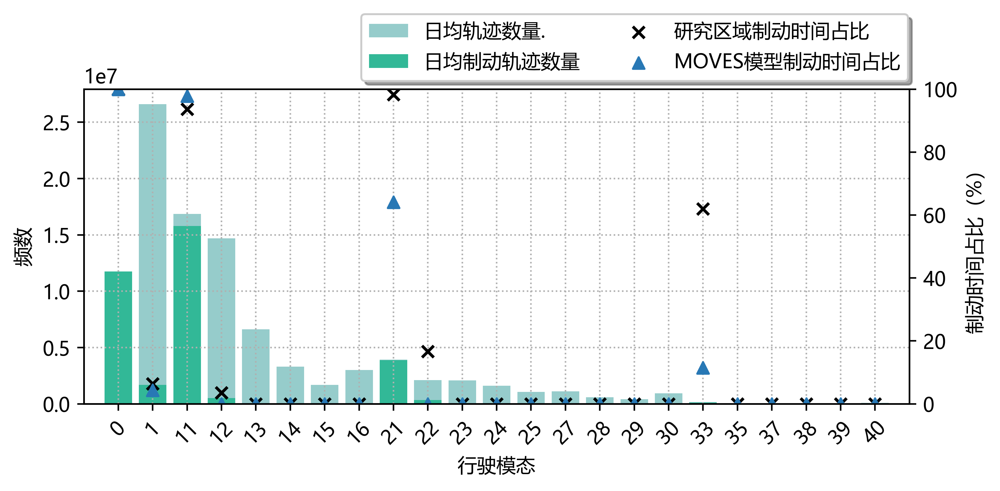

In [27]:
# plot OpMode info
fig, ax = plt.subplots(1,1, figsize=(7,3), constrained_layout=True)

# count-bar
modes = np.arange(0,agg_OpMode.shape[0])
ax.bar(modes, agg_OpMode['trajCount'] / 30, color=GREEN, label="日均轨迹数量.", zorder=1)
ax.bar(modes, agg_OpMode['brakeCount'] / 30, color=DEEPGREEN, label="日均制动轨迹数量", zorder=1)

ax.set_xlim(-1,agg_OpMode.shape[0])
ax.set_xticks(modes)
ax.set_xticklabels(agg_OpMode.index, rotation=45)

# frac-scatter
ax_ = ax.twinx()
ax_.scatter(modes, agg_OpMode['brakeFrac']*100, color="k", marker="x", label="研究区域制动时间占比", zorder=2)
ax_.set_ylim(0, 100)

# frac in MOVES-scatter
x_MOVES = modes
frac_MOVES = np.array((100, 4.37, 97.8, 0, 0, 0, 0, 0, 64.1, 0, 0, 0, 0, 0, 0, 0, 0, 11.5, 0, 0, 0, 0, 0))
ax_.scatter(x_MOVES, frac_MOVES, marker="^", color=BLUE, label="MOVES模型制动时间占比", zorder=2)

# labels
ax.set_xlabel("行驶模态")
ax.set_ylabel("频数")
ax_.set_ylabel("制动时间占比（%）")

ax.grid(axis="y", linestyle=":", zorder=0)
ax.grid(axis="x", linestyle=":", zorder=0)

fig.legend(loc=1, bbox_to_anchor=(1.01,1.27), bbox_transform=ax.transAxes, ncol=2, shadow=True)
plt.show()

## Uncertainty

In [3]:
# initialize a BWETool object
from emission import BWETool
BWE = BWETool()

# test grid
f_ratios = np.arange(0.6, 0.81, 0.033)  # front ratio
r_f_ratios = np.round((1 - f_ratios) / f_ratios, 2)  # rear/front ratio
# drum_disc_ratios = np.arange(0.12, 0.49, 0.06)  # drum/disc ratio
drum_disc_ratios = np.linspace(0.1205, 0.4667, 7)  # drum/disc ratio

In [4]:
# ER calculation function
def vehER(
    decel,
    prop_NAO_f = 0.7974,
    prop_LM_f = 0.1775,
    prop_SM_f = 0.0251,
    prop_NAO_r = 0.8186,
    prop_LM_r = 0.1755,
    prop_SM_r = 0.0058,
    prop_drum_f = 0,
    prop_drum_r = 0.2228,
    r_f_ratio = 0.5,  # brake force on front axle vs rear axle
    drum_disc_ratio = 0.3, # ratio of drum emissions to disc emissions 
):
    def pow(x, a, b):
        return a * np.power(x, b)
    
    # mix for disc brake
    ER_f_disc = (pow(decel, *BWE.ER.NAO_POW_PARAM) * prop_NAO_f) \
              + (pow(decel, *BWE.ER.LM_POW_PARAM) * prop_LM_f) \
              + (pow(decel, *BWE.ER.SM_POW_PARAM) * prop_SM_f)
    ER_r_disc = (pow(decel, *BWE.ER.NAO_POW_PARAM) * prop_NAO_r) \
              + (pow(decel, *BWE.ER.LM_POW_PARAM) * prop_LM_r) \
              + (pow(decel, *BWE.ER.SM_POW_PARAM) * prop_SM_r)
    ER_r_disc *= r_f_ratio
    
    # adjust for axles
    ER_f_drum = ER_f_disc * drum_disc_ratio
    ER_r_drum = ER_r_disc * drum_disc_ratio

    # mix for veh
    ER = (1 - prop_drum_f) * ER_f_disc \
        + prop_drum_f * ER_f_drum \
        + (1 - prop_drum_r) * ER_r_disc \
        + prop_drum_r * ER_r_drum
    
    return ER * 2

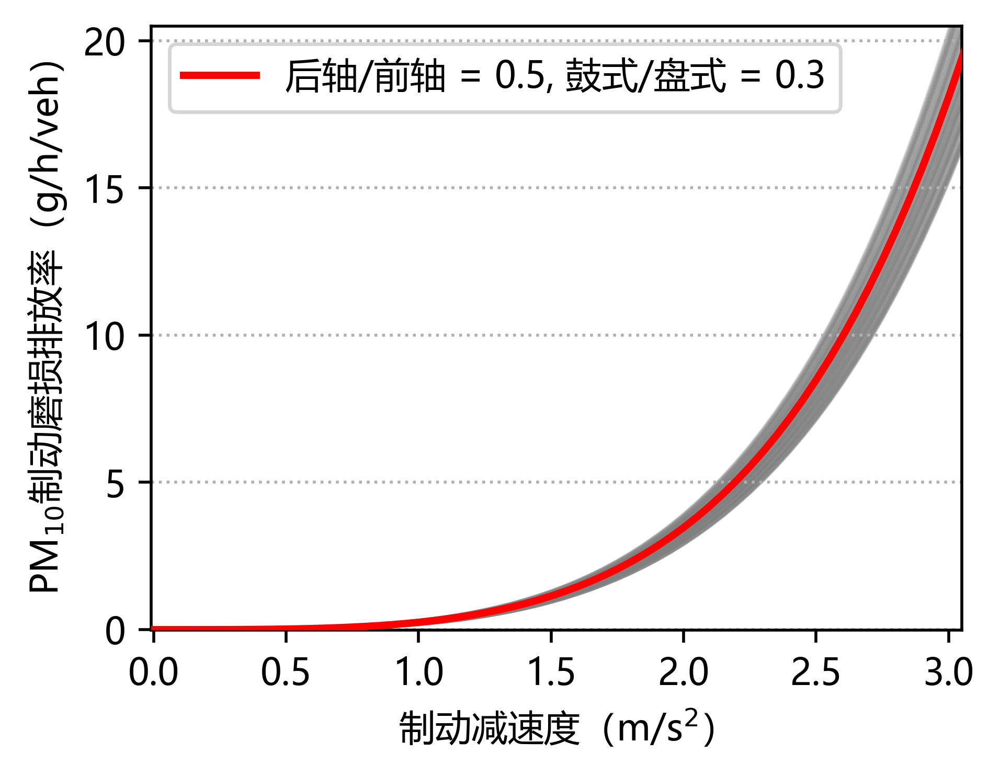

In [8]:
plt.figure(figsize=(4,3))

# plot ER-decel curve under different params
decel = np.arange(0,3.5, 0.05)
for r_f_ratio in r_f_ratios:
    for drum_disc_ratio in drum_disc_ratios:
        ERs = vehER(decel, r_f_ratio=r_f_ratio, drum_disc_ratio=drum_disc_ratio)
        if r_f_ratio == 0.5 and round(drum_disc_ratio, 1) == 0.3:
            plt.plot(decel, ERs, label=f'后轴/前轴 = {0.5}, 鼓式/盘式 = {0.3}', linewidth=2, color='red', zorder=10)
        else:
            plt.plot(decel, ERs, alpha=0.3, color='gray', zorder=1)

# axis and legend
plt.xlim(-0.01, 3.05)
plt.ylim(-0.01, 20.5)
plt.xlabel("制动减速度（m/s$^2$）")
plt.ylabel("PM$_{10}$制动磨损排放率（g/h/veh）")
plt.legend()
plt.grid(axis='y', linestyle=':', zorder=0)
plt.show()

In [6]:
# load OpMode aggregation data
import pickle
with open("./data/agg/agg_OpMode.pkl", 'rb') as f:
    agg_OpMode = pickle.load(f)
agg_OpMode['brakeFrac'] = agg_OpMode['brakeCount'] / agg_OpMode['trajCount']
agg_OpMode['brakeDecelBinFrac'] = agg_OpMode['brakeDecelBinCount'] / agg_OpMode['brakeCount']

# load decel bins
from analysis import Aggregator
agg = Aggregator()
DECEL_BIN = agg.BRAKE_DECEL_BIN

def calOpModeERs(df, r_f_ratio, drum_disc_ratio):
    return df.apply(
        lambda x: sum(vehER(DECEL_BIN[:-1], r_f_ratio=r_f_ratio, drum_disc_ratio=drum_disc_ratio) * x['brakeDecelBinFrac'] * x['brakeFrac']),
        axis=1
    ).to_numpy()

In [7]:
# calculate ER under params
OpModes = [0,1,11,12,13,14,15,16,21,22,23,24,25,27,28,29,30,33,35,37,38,39,40]
OpMode_ERs = {opmode: [] for opmode in OpModes}
for r_f_ratio in r_f_ratios:
    for drum_disc_ratio in drum_disc_ratios:
        er_values = calOpModeERs(agg_OpMode, r_f_ratio, drum_disc_ratio)
        for opmode, er_value in zip(OpModes, er_values):
            OpMode_ERs[opmode].append(er_value)
# calculate ER under assumed params
assumed_ERs = {opmode: [] for opmode in OpModes}
assumed_er_values = calOpModeERs(agg_OpMode, r_f_ratio=0.5, drum_disc_ratio=0.3)
for opmode, er_value in zip(OpModes, assumed_er_values):
        assumed_ERs[opmode].append(er_value)

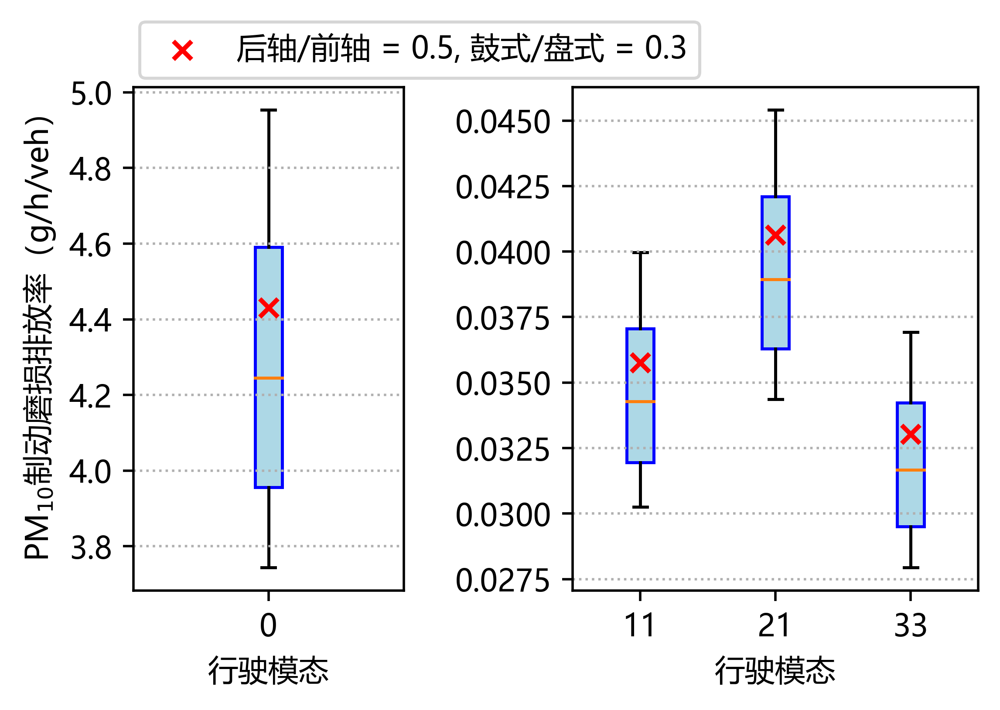

In [11]:
# box plot
fig, ax = plt.subplots(1,2,figsize=(5,3), gridspec_kw={'width_ratios': [1,1.5]})
plt.subplots_adjust(wspace=0.5)

# OpMode0
boxplot_data = [OpMode_ERs[opmode] for opmode in [0]]
ax[0].boxplot(boxplot_data, labels=[0], widths=0.1, patch_artist=True, boxprops=dict(facecolor='lightblue', color='blue'), zorder=1)
ax[0].set_ylabel("PM$_{10}$制动磨损排放率（g/h/veh）")
ax[0].set_xlabel('行驶模态')

# OpMode brake
OpModes_brake = [11, 21, 33]
boxplot_data = [OpMode_ERs[opmode] for opmode in OpModes_brake]
ax[1].boxplot(boxplot_data, labels=OpModes_brake, widths=0.2, patch_artist=True, boxprops=dict(facecolor='lightblue', color='blue'), zorder=1)
ax[1].set_xlabel('行驶模态')

# highlight
ax[0].scatter([1], assumed_ERs[0], color='red', marker='x', label=f'后轴/前轴={0.5}, 鼓式/盘式={0.3}', zorder=10)
ax[1].scatter(range(1,4), [assumed_ERs[i] for i in OpModes_brake], color='red', marker='x', label=f'后轴/前轴 = {0.5}, 鼓式/盘式 = {0.3}', zorder=10)

# axis and legend
ax[1].legend(bbox_to_anchor=(0.35, 1.16), bbox_transform=ax[1].transAxes)
ax[0].grid(axis='y', linestyle=':', zorder=0)
ax[1].grid(axis='y', linestyle=':', zorder=0)
plt.show()

In [12]:
import pickle
with open("./data/agg/agg_link.pkl", 'rb') as f:
    agg_link = pickle.load(f)

# parameter calculation
def calEF(aggFile, r_f_ratio, drum_disc_ratio):
    OpModeERs = np.nan_to_num(calOpModeERs(agg_OpMode, r_f_ratio, drum_disc_ratio))
    aggFile.dropna(inplace=True)
    aggFile['OpModeFrac'] = aggFile['OpModeCount'] / aggFile['trajCount']
    aggFile['PM10 ER Avg'] = aggFile['OpModeFrac'].apply(lambda x: sum(x * OpModeERs))
    aggFile['Daily BWE'] = aggFile['PM10 ER Avg'] * aggFile['trajCount'] / 3600 / 30
    aggFile['PM10 EF Avg'] = aggFile['Daily BWE'] * 30 / aggFile['mileage'] * 1000  # mg/km/veh
    aggFile.replace(np.inf, 0, inplace=True)
    weight = 'trajCount'
    aggFile.fillna(0, inplace=True)
    weighted_ave_EF = sum(aggFile['PM10 EF Avg'] * aggFile[weight]) / aggFile[weight].sum()
    return weighted_ave_EF

In [13]:
EFs = {'rear/front':[], 'drum/disc':[], 'EF':[]}
for r_f_ratio in r_f_ratios:
    for drum_disc_ratio in drum_disc_ratios:
        ef = calEF(agg_link, r_f_ratio, drum_disc_ratio)
        EFs['rear/front'].append(r_f_ratio)
        EFs['drum/disc'].append(drum_disc_ratio)
        EFs['EF'].append(ef)
EFs = pd.DataFrame(EFs)

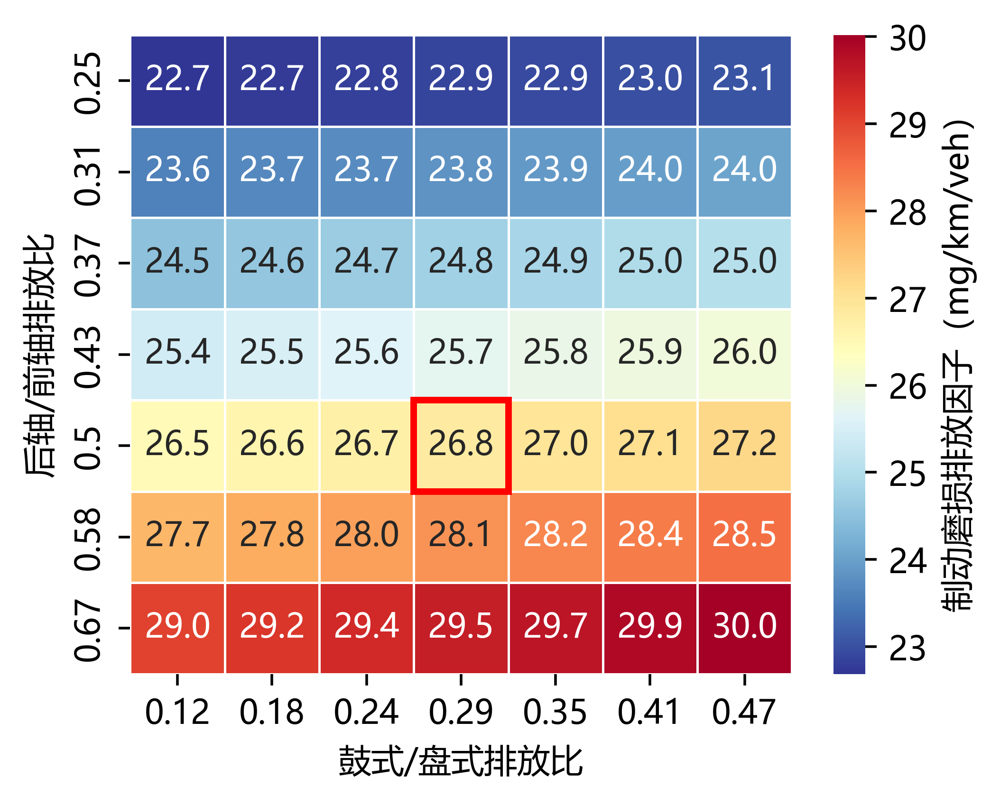

In [16]:
import seaborn as sns
from matplotlib.patches import Rectangle
# heat map
plt.figure(figsize=(4.5,3.5))
pivot_table = EFs.pivot(index='rear/front', columns='drum/disc', values='EF')
pivot_table.columns = np.round(pivot_table.columns, decimals=2)
ax = sns.heatmap(pivot_table, annot=True, fmt='.1f', cmap='RdYlBu_r', linecolor='white', linewidths=0.5)

# colorbar
colorbar = ax.collections[0].colorbar
colorbar.set_label('制动磨损排放因子（mg/km/veh）')

# highlight
row = 0.5
col = 0.29
row_index = pivot_table.index.tolist().index(row)
col_index = pivot_table.columns.tolist().index(col)
ax.add_patch(Rectangle((col_index, row_index), 1, 1, fill=False, edgecolor='red', lw=2))

# axis and label
plt.xlabel('鼓式/盘式排放比')
plt.ylabel('后轴/前轴排放比')
plt.show()